In [ ]:
# To check the GPU memory allocated in Google Colab
!nvidia-smi

Sun Aug  9 15:19:36 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P8    12W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals

try:
  !pip uninstall tb-nightly tensorboardX tensorboard
  !pip install tf-nightly

except Exception:
  pass

import tensorflow as tf

import os
import datetime
import tensorflow_datasets as tfds

%load_ext tensorboard

Uninstalling tensorboard-2.3.0:
  Would remove:
    /usr/local/bin/tensorboard
    /usr/local/lib/python3.6/dist-packages/tensorboard-2.3.0.dist-info/*
    /usr/local/lib/python3.6/dist-packages/tensorboard/*
Proceed (y/n)? y
  Successfully uninstalled tensorboard-2.3.0
     |████████████████████████████████| 325.1MB 46kB/s 
     |████████████████████████████████| 460kB 51.7MB/s 
     |████████████████████████████████| 12.2MB 253kB/s 


In [ ]:
import pkg_resources

for entry_point in pkg_resources.iter_entry_points('tensorboard_plugins'):
  print(entry_point.dist)

tensorboard 2.3.0
tensorboard-plugin-wit 1.7.0


In [ ]:
# To remove one tensorboardf

!rm -r /usr/local/lib/python3.6/dist-packages/tensorboardcolab-0.0.22.dist-info/

In [ ]:
print(tf.__version__)

2.4.0-dev20200809


In [ ]:
# List of physical devices

tf.config.experimental.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:XLA_CPU:0', device_type='XLA_CPU'),
 PhysicalDevice(name='/physical_device:XLA_GPU:0', device_type='XLA_GPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
# Loading the amazon us reviews dataset for only mobile electronics (100K records).
dataset, info = tfds.load('amazon_us_reviews/Mobile_Electronics_v1_00', with_info=True)
train_dataset = dataset['train']

/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


Shuffling and writing examples to /root/tensorflow_datasets/amazon_us_reviews/Mobile_Electronics_v1_00/0.1.0.incompleteOGEZRO/amazon_us_reviews-train.tfrecord


ERROR:absl:Statistics generation doesn't work for nested structures yet



Dataset amazon_us_reviews downloaded and prepared to /root/tensorflow_datasets/amazon_us_reviews/Mobile_Electronics_v1_00/0.1.0. Subsequent calls will reuse this data.


In [ ]:
# Info about the dataset. There are many fields and we will be using review_body and star_rating for this problem
info

tfds.core.DatasetInfo(
    name='amazon_us_reviews',
    version=0.1.0,
    description='Amazon Customer Reviews (a.k.a. Product Reviews) is one of Amazons iconic products. In a period of over two decades since the first review in 1995, millions of Amazon customers have contributed over a hundred million reviews to express opinions and describe their experiences regarding products on the Amazon.com website. This makes Amazon Customer Reviews a rich source of information for academic researchers in the fields of Natural Language Processing (NLP), Information Retrieval (IR), and Machine Learning (ML), amongst others. Accordingly, we are releasing this data to further research in multiple disciplines related to understanding customer product experiences. Specifically, this dataset was constructed to represent a sample of customer evaluations and opinions, variation in the perception of a product across geographical regions, and promotional intent or bias in reviews.

Over 130+ million cus

In [ ]:
len(list(train_dataset))

104975

In [ ]:
BUFFER_SIZE = 30000
BATCH_SIZE = 128

In [ ]:
# Shuffle the train dataset
train_dataset = train_dataset.shuffle(BUFFER_SIZE, reshuffle_each_iteration=False)

In [ ]:
# Data is in the form of trensors
for reviews in train_dataset.take(2):
  print(reviews)

{'data': {'customer_id': <tf.Tensor: shape=(), dtype=string, numpy=b'28646913'>, 'helpful_votes': <tf.Tensor: shape=(), dtype=int32, numpy=0>, 'marketplace': <tf.Tensor: shape=(), dtype=string, numpy=b'US'>, 'product_category': <tf.Tensor: shape=(), dtype=string, numpy=b'Mobile_Electronics'>, 'product_id': <tf.Tensor: shape=(), dtype=string, numpy=b'B00QUV8SE8'>, 'product_parent': <tf.Tensor: shape=(), dtype=string, numpy=b'53950313'>, 'product_title': <tf.Tensor: shape=(), dtype=string, numpy=b'**NEW** ONPRO GT-R5800 Car Driving Recorder DVR Blackbox Dash Cam 1080p 16:9 2.7" TFT LCD'>, 'review_body': <tf.Tensor: shape=(), dtype=string, numpy=b'I LOVE IT!!! GOOD OUTFIT EASY TO USE COMPARE TO CHEAP DASH CAM PRODUCT THIS ONE NIGHT TIME RECORDING IT IS WAY BETTER!! AND I FEEL MUCH SAFER ALREADY!!!'>, 'review_date': <tf.Tensor: shape=(), dtype=string, numpy=b'2015-04-25'>, 'review_headline': <tf.Tensor: shape=(), dtype=string, numpy=b'AMAZING PRODUCT!!!'>, 'review_id': <tf.Tensor: shape=()

In [ ]:
for reviews in train_dataset.take(10):
  review_text = reviews['data']
  print(review_text.get('review_body').numpy())
  print(review_text.get('star_rating'))
  print(tf.where(review_text.get('star_rating')>3,1,0).numpy())

# Assigning Rating above 3 as a positive sentiment and others as negative sentiment

b'I LOVE IT!!! GOOD OUTFIT EASY TO USE COMPARE TO CHEAP DASH CAM PRODUCT THIS ONE NIGHT TIME RECORDING IT IS WAY BETTER!! AND I FEEL MUCH SAFER ALREADY!!!'
tf.Tensor(5, shape=(), dtype=int32)
1
b'Nice box. Only 4 screws holding sub in. Not marked if it is wired in 1 ohm or 4 ohm load. Cheap sub but works ok hooked to a 250 watt Sony amp from 1992. Cheap surround on sub. Get what you pay for.'
tf.Tensor(4, shape=(), dtype=int32)
1
b"I really like this product. it's a true fit screen protector, covers the whole screen of the zune hd and it was easy to put on the first try... looks great<br />i recommend these zune hd sreen protecors to everyone!!"
tf.Tensor(5, shape=(), dtype=int32)
1
b'This little Bluetooth audio adaptor does exactly what I was looking for. Give it USB power and it turns on immediately and auto-pairs with the last paired device. Perfect way to add Bluetooth support to a car stereo that has a USB slot and aux port. The adaptor makes a pleasant indicator tune when a devic

In [ ]:
tokenizer  = tfds.features.text.Tokenizer()

vocabulary_set = set()

for _, reviews in train_dataset.enumerate():
  review_text = reviews['data']
  reviews_tokens = tokenizer.tokenize(review_text.get('review_body').numpy())
  vocabulary_set.update(reviews_tokens)

  vocab_size = len(vocabulary_set)
  vocab_size

In [ ]:
# To encode the vocabulary set
encoder = tfds.features.text.TokenTextEncoder(vocabulary_set)

In [ ]:
print(vocabulary_set)

{'k1', 'roomates', 'docks', 'Spider', 'Muwatta', 'disheartening', 'Adler', 'robo', '265W', 'koomus', 'PRODUCER', 'ligne', 'aspherical', 'Absolute', 'downloadedand', 'RA200', 'promotly', '516', 'trucj', 'ismoooth', 'Ozi', 'faulse', 'UNDERSPECED', 'musicality', 'worrys', 'base', 'unlighted', 'sbouldnt', 'Saharan', 'Screenshots', 'unpaved', 'fab', 'thissssss', 'informed', 'ore', 'Responsive', 'nest', 'Dropbox', 'divert', '16pt', 'Groove', 'egh', 'Large', 'AVRCP', 'pleasd', 'neatnik', 'grippy', 'Matter', 'Ipearl', 'compartment', 'thene', '2AA', 'B005TMYUYQ', 'omissions', 'escort', 'ipad2', 'VP', 'inefficient', '5400', 'navigators', 'teaspoon', 'Inconsistent', 'varios', 'EU3000', 'amms', 'member', 'recomrd', 'simle', 'glean', 'Pocketcasts', 'Meilleur', 'corner', 'CELLS', 'bums', 'lapped', 'shakers', 'electrican', 'rawks', 'chiped', 'Sauconys', 'destinctive', 'Canceled', 'Waaayyyyy', 'compcompetions', '450W', 'cierras', 'dau', 'rooftop', 'nfc', 'rsonally', 'classes', 'working', 'undershell',

In [ ]:
for reviews in train_dataset.take(5):
  review_text = reviews['data']
  print(review_text.get('review_body').numpy())
  encoded_example = encoder.encode(review_text.get('review_body').numpy())
  print(encoded_example)

b'I LOVE IT!!! GOOD OUTFIT EASY TO USE COMPARE TO CHEAP DASH CAM PRODUCT THIS ONE NIGHT TIME RECORDING IT IS WAY BETTER!! AND I FEEL MUCH SAFER ALREADY!!!'
[38526, 24829, 45995, 15496, 22159, 21564, 45136, 39972, 1672, 45136, 3202, 22839, 53682, 65632, 47605, 55942, 52697, 11749, 18266, 45995, 36565, 47816, 38763, 68508, 38526, 50534, 12490, 46029, 5266]
b'Nice box. Only 4 screws holding sub in. Not marked if it is wired in 1 ohm or 4 ohm load. Cheap sub but works ok hooked to a 250 watt Sony amp from 1992. Cheap surround on sub. Get what you pay for.'
[70239, 21595, 57942, 73491, 44065, 19372, 45988, 38317, 10609, 30739, 68062, 37362, 15421, 56042, 38317, 36058, 20148, 64376, 73491, 20148, 35070, 9134, 45988, 30616, 8279, 55837, 71101, 69664, 68558, 53496, 62535, 72967, 34440, 20969, 61282, 9134, 52416, 4454, 45988, 46560, 11848, 20748, 15437, 1432]
b"I really like this product. it's a true fit screen protector, covers the whole screen of the zune hd and it was easy to put on the firs

In [ ]:
# Looking at the encoded values for a sample review
for index in encoded_example:
  print('{} ---> {}'.format(index, encoder.decode([index])))

26002 ---> This
70387 ---> itouch
41608 ---> case
7872 ---> looked
27383 ---> very
70808 ---> nice
30616 ---> but
23178 ---> did
40110 ---> not
2354 ---> last
47465 ---> longer
18302 ---> than
68558 ---> a
1924 ---> few
52943 ---> months
38526 ---> I
58764 ---> would
40110 ---> not
10558 ---> recommend
46050 ---> this
4571 ---> product


In [ ]:
'''
This function is to encode the reviews.

Args: review tensor and label tensor

returns: encoded text, label
'''
def encode(text_tensor, label_tensor):
  encoded_text = encoder.encode(text_tensor.numpy())
  label = tf.where(label_tensor>3,1,0)
  return encoded_text, label

In [ ]:
'''
This function takes in tensor and calls encode function. 

Args: tensor

returns: encoded_text, label
'''
def encode_map_fn(tensor):

  text = tensor['data'].get('review_body')
  label = tensor['data'].get('star_rating')

  encoded_text, label = tf.py_function(encode,
                                       inp = [text, label],
                                       Tout = (tf.int64, tf.int32))
  
  encoded_text.set_shape([None])
  label.set_shape([])

  return encoded_text, label

In [ ]:
ar_encoded_data = train_dataset.map(encode_map_fn)

In [ ]:
# Looking at the encoded text and label for 5 reviews
for f1, f2 in ar_encoded_data.take(5):
  print(f1)
  print(f2)

tf.Tensor(
[38526 24829 45995 15496 22159 21564 45136 39972  1672 45136  3202 22839
 53682 65632 47605 55942 52697 11749 18266 45995 36565 47816 38763 68508
 38526 50534 12490 46029  5266], shape=(29,), dtype=int64)
tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(
[70239 21595 57942 73491 44065 19372 45988 38317 10609 30739 68062 37362
 15421 56042 38317 36058 20148 64376 73491 20148 35070  9134 45988 30616
  8279 55837 71101 69664 68558 53496 62535 72967 34440 20969 61282  9134
 52416  4454 45988 46560 11848 20748 15437  1432], shape=(44,), dtype=int64)
tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(
[38526 28176 23776 46050  4571 37362 59772 68558  6324 36462 34418 39004
 37331 59755 48359 34418 35968 59755 26236 26518 51322 37362 67887  6325
 69664 42363  4454 59755 24007 49971  5958 10000  8257 64078 10558  3949
 26236 26518 40044 52819 69664 40160], shape=(42,), dtype=int64)
tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(
[26002  2829 60260 13632  8176 39622 72995 11848 38526 67887 28

In [ ]:
# Taking 20K for training
TAKE_SIZE = 20000

train_data = ar_encoded_data.skip(TAKE_SIZE).shuffle(BUFFER_SIZE)
train_data = train_data.padded_batch(BATCH_SIZE) 
'''
 Padding with batch size - looks at each batch. Calculate the maximum length in 
 each batch and pads the remaining reviews to maximum lenght.
'''

test_data = ar_encoded_data.take(TAKE_SIZE)
test_data = test_data.padded_batch(BATCH_SIZE)

In [ ]:
vocab_size += 1

In [ ]:
sample_text, sample_labels = next(iter(test_data))

sample_text[0], sample_labels[0]

(<tf.Tensor: shape=(584,), dtype=int64, numpy=
 array([38526, 24829, 45995, 15496, 22159, 21564, 45136, 39972,  1672,
        45136,  3202, 22839, 53682, 65632, 47605, 55942, 52697, 11749,
        18266, 45995, 36565, 47816, 38763, 68508, 38526, 50534, 12490,
        46029,  5266,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,  

In [ ]:
# Target distribution for 10 batches

for f1, f2 in test_data.take(10):
  print(tf.unique_with_counts(f2)[2].numpy())

[90 38]
[48 80]
[85 43]
[86 42]
[87 41]
[50 78]
[44 84]
[89 39]
[38 90]
[92 36]


In [ ]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Embedding(vocab_size, 128)) # Alternatively glove vector
model.add(tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True)))
model.add(tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)))

for units in [64, 64]: # Adding 2 dense layers of 64
  model.add(tf.keras.layers.Dense(units, activation= 'relu'))

model.add(tf.keras.layers.Dense(1)) # Classification Output

In [ ]:
!rm -r /tmp/logs/

rm: cannot remove '/tmp/logs/': No such file or directory


In [ ]:
logdir = os.path.join("/tmp/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback =  tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath= '/tmp/sentiment_analysis.hdf5',
                                                  verbose=1, save_best_only=True)

model.compile(optimizer='adam',
              loss = tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics = ['accuracy'])

In [ ]:
history = model.fit(train_data, epochs= 4, validation_data=test_data, 
                    callbacks = [tensorboard_callback, checkpointer])

Epoch 1/4
      1/Unknown - 51s 51s/step - loss: 0.6940 - accuracy: 0.3438WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1371: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


    664/Unknown - 283s 426ms/step - loss: 0.4293 - accuracy: 0.7798
Epoch 00001: val_loss improved from inf to 0.31149, saving model to /tmp/sentiment_analysis.hdf5
664/664 [==============================] - 313s 472ms/step - loss: 0.4292 - accuracy: 0.7799 - val_loss: 0.3115 - val_accuracy: 0.8726
Epoch 2/4
664/664 [==============================] - ETA: 0s - loss: 0.2765 - accuracy: 0.8840
Epoch 00002: val_loss improved from 0.31149 to 0.29678, saving model to /tmp/sentiment_analysis.hdf5
664/664 [==============================] - 294s 443ms/step - loss: 0.2765 - accuracy: 0.8840 - val_loss: 0.2968 - val_accuracy: 0.8787
Epoch 3/4
664/664 [==============================] - ETA: 0s - loss: 0.2180 - accuracy: 0.9113
Epoch 00003: val_loss did not improve from 0.29678
664/664 [==============================] - 290s 437ms/step - loss: 0.2180 - accuracy: 0.9113 - val_loss: 0.3129 - val_accuracy: 0.8525
Epoch 4/4
664/664 [==============================] - ETA: 0s - loss: 0.1762 - accuracy: 

In [ ]:
model.save('/tmp/final_sentiment_analysis.hdf5')

In [ ]:
!ls -alrt /tmp/*.hdf5

-rw-r--r-- 1 root root 118632984 Aug  9 16:32 /tmp/sentiment_analysis.hdf5
-rw-r--r-- 1 root root 118632984 Aug  9 16:48 /tmp/final_sentiment_analysis.hdf5


In [ ]:
eval_loss, eval_acc = model.evaluate(test_data)

print('Eval Loss: {:.3f}, Eval Accuracy: {:.3f}'.format(eval_loss, eval_acc))

157/157 [==============================] - 29s 185ms/step - loss: 0.2881 - accuracy: 0.8844
Eval Loss: 0.288, Eval Accuracy: 0.884


In [ ]:
# For each batch
for f1, f2 in test_data.take(1):
  print(f2)
  print(model.predict(f1))

tf.Tensor(
[1 1 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 0 0 0 1 1 1 0 0 0 1 1 1 1 1 1 1
 0 1 1 1 0 1 1 1 1 0 1 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1
 0 0 1 0 1 1 0 0 1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 1 0
 1 1 1 0 1 1 1 0 1 1 0 1 1 0 0 1 0], shape=(128,), dtype=int32)
[[ 4.0439744 ]
 [-3.173509  ]
 [ 4.9145064 ]
 [ 4.9442697 ]
 [-5.8616934 ]
 [-6.5090055 ]
 [ 5.7661166 ]
 [-4.099108  ]
 [ 3.0750587 ]
 [-1.6997265 ]
 [ 2.2128782 ]
 [ 2.7848818 ]
 [-3.84582   ]
 [ 2.6705863 ]
 [-5.533593  ]
 [ 4.664875  ]
 [-4.4125166 ]
 [ 3.358371  ]
 [ 4.661081  ]
 [ 4.791892  ]
 [ 5.020934  ]
 [-6.0635614 ]
 [-3.6746125 ]
 [ 0.61076456]
 [ 1.7026612 ]
 [ 6.0376    ]
 [ 3.554763  ]
 [-5.248996  ]
 [-0.27718145]
 [-5.711236  ]
 [ 3.7720869 ]
 [ 2.577768  ]
 [ 4.645826  ]
 [ 2.6477547 ]
 [ 5.623016  ]
 [ 5.681636  ]
 [ 0.6690987 ]
 [-3.3124866 ]
 [ 0.12112815]
 [ 0.938864  ]
 [ 2.4408958 ]
 [ 1.1182958 ]
 [ 5.6315455 ]
 [ 2.4434729 ]
 [ 3.4148605 ]
 [ 5.4133162 ]
 [-2.95018

In [ ]:
model.layers

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, None, 128)         9438592   
_________________________________________________________________
bidirectional_1 (Bidirection (None, None, 256)         263168    
_________________________________________________________________
bidirectional_2 (Bidirection (None, 128)               164352    
_________________________________________________________________
dense (Dense)                (None, 64)                8256      
_________________________________________________________________
dense_1 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 65        
Total params: 9,878,593
Trainable params: 9,878,593
Non-trainable params: 0
____________________________________________

In [ ]:
model.get_layer('embedding_1').output

<KerasTensor: shape=(None, None, 128) dtype=float32 (created by layer 'embedding_1')>

In [ ]:
!nvidia-smi

Sun Aug  9 16:57:03 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   73C    P0    33W /  70W |   8871MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import matplotlib.pyplot as plt

'''
plot_graphs funtion takes in history object of model and the metric to plot.
'''
def plot_graphs(history, metric):
  plt.plot(history.history[metric])
  plt.plot(history.history['val_'+metric], '')
  plt.xlabel('Epochs')
  plt.ylabel(metric)
  plt.legend([metric, 'val_'+metric])
  plt.show()

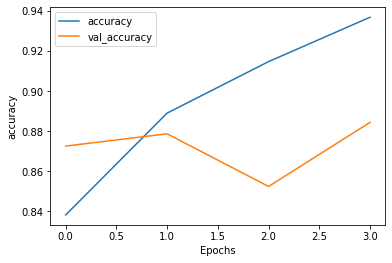

In [ ]:
plot_graphs(history, 'accuracy')

In [ ]:
tf.keras.backend.clear_session()

sa_load = tf.keras.models.load_model('/tmp/sentiment_analysis.hdf5', compile = False)

In [ ]:
'''
Function crestes padding to the vector such that each batch will have vectors of
maximum size.

args: vector, size of vector

returns: padded vector
'''
def pad_to_size(vec, size):
  zeroes = [0] * (size - len(vec))
  vec.extend(zeroes)

  return vec

In [ ]:
def predict_fn(pred_text):
  encoded_pred_text = encoder.encode(pred_text)
  print(encoded_pred_text)
  encoded_pred_text = pad_to_size(encoded_pred_text, 32)
  print(encoded_pred_text)
  encoded_pred_text = tf.cast(encoded_pred_text, tf.float32)
  prediction = sa_load.predict(tf.expand_dims(encoded_pred_text, 0))

  return (prediction)

In [ ]:
pred_text = ('The color is bad. Not worth the money')
predictions = predict_fn(pred_text)
print(predictions) # Negative value means negative review

[26397, 55424, 15421, 25360, 10609, 67859, 59755, 3803]
[26397, 55424, 15421, 25360, 10609, 67859, 59755, 3803, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[[-4.5667176]]


In [ ]:
pred_text = ('Looks similar to the images shown. Pretty good!')
predictions = predict_fn(pred_text)
print(predictions) # positive value means positive review

[331, 68251, 69664, 59755, 67846, 63452, 73613, 54706]
[331, 68251, 69664, 59755, 67846, 63452, 73613, 54706, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[[1.6775547]]


In [ ]:
print(tf.distribute.get_strategy())

In [ ]:
%reload_ext tensorboard

In [ ]:
%tensorboard --logdir /tmp/logs

<IPython.core.display.Javascript object>